DSC540 Week 7-8 <br>
Final Project Milestone 5 <br>
Author Michael Paris <br>
11/09/2021 <br>

- Now that you have cleaned and transformed your 3 datasets, you need to load them into a database. 
- You can choose what kind of database (SQLLite or MySQL, Postgre SQL are all free options). 
- You will want to load each dataset into SQL Lite as an individual table and then you must join the datasets together in Python into 1 dataset.
- Once all the data is merged together in your database, create 5 visualizations that demonstrate the data you have cleansed. 
- You should have at least 2 visualizations that have data from more than one source (meaning, if you have 3 tables, you must have visualizations that span across 2 of the tables – you are also welcome to use your consolidated dataset that you created in the previous step, if you do that, you have met this requirement).
- Clearly label each visualization. 
- Submit your code for merging and storing in the database, with your code for the visualizations along with a 250-500-word summary of what you learned and had to do to complete the project. 
- In your write-up, make sure to address the ethical implications of cleansing data and your project topic. 
- You can submit a Jupyter Notebook or a PDF of your code. 
- If you submit a .py file you need to also include a PDF or attachment of your results.

In [1]:
#
#show population growth and gun violence data on a bar graph (split)
#for the write-up, discuss the ethics of removing data from a dataset, especially in a sensitive set like gun violence
#and not just sensative, but something that could be used to shape policy such as police procedures or gun laws

In [2]:
%config IPCompleter.greedy=True
import pandas as pd
import matplotlib
import numpy as np
from bs4 import BeautifulSoup
import requests
import regex
import ssl
import re
import urllib.request, urllib.parse, urllib.error
import json
import os
import sqlite3
from matplotlib import pyplot as plt
import calendar
import plotly as py
import plotly.express as px

In [3]:
#we'll use this a couple of times, so put it here and type it once.

state_to_abbrev = {
    "ALABAMA": "AL",
    "ALASKA": "AK",
    "ARIZONA": "AZ",
    "ARKANSAS": "AR",
    "CALIFORNIA": "CA",
    "COLORADO": "CO",
    "CONNECTICUT": "CT",
    "DELAWARE": "DE",
    "FLORIDA": "FL",
    "GEORGIA": "GA",
    "HAWAII": "HI",
    "IDAHO": "ID",
    "ILLINOIS": "IL",
    "INDIANA": "IN",
    "IOWA": "IA",
    "KANSAS": "KS",
    "KENTUCKY": "KY",
    "LOUISIANA": "LA",
    "MAINE": "ME",
    "MARYLAND": "MD",
    "MASSACHUSETTS": "MA",
    "MICHIGAN": "MI",
    "MINNESOTA": "MN",
    "MISSISSIPPI": "MS",
    "MISSOURI": "MO",
    "MONTANA": "MT",
    "NEBRASKA": "NE",
    "NEVADA": "NV",
    "NEW HAMPSHIRE": "NH",
    "NEW JERSEY": "NJ",
    "NEW MEXICO": "NM",
    "NEW YORK": "NY",
    "NORTH CAROLINA": "NC",
    "NORTH DAKOTA": "ND",
    "OHIO": "OH",
    "OKLAHOMA": "OK",
    "OREGON": "OR",
    "PENNSYLVANIA": "PA",
    "RHODE ISLAND": "RI",
    "SOUTH CAROLINA": "SC",
    "SOUTH DAKOTA": "SD",
    "TENNESSEE": "TN",
    "TEXAS": "TX",
    "UTAH": "UT",
    "VERMONT": "VT",
    "VIRGINIA": "VA",
    "WASHINGTON": "WA",
    "WEST VIRGINIA": "WV",
    "WISCONSIN": "WI",
    "WYOMING": "WY",
    "DISTRICT OF COLUMBIA": "DC",
    "AMERICAN SAMOA": "AS",
    "GUAM": "GU",
    "NORTHERN MARIANA ISLANDS": "MP",
    "PUERTO RICO": "PR",
    "UNITED STATES MINOR OUTLYING ISLANDS": "UM",
    "U.S. VIRGIN ISLANDS": "VI",
    'ALBERTA': 'AB',
    'BRITISH COLUMBIA': 'BC',
    'MANITOBA': 'MB',
    'NEW BRUNSWICK': 'NB',
    'NEWFOUNDLAND AND LABRADOR': 'NL',
    'NORTHWEST TERRITORIES': 'NT',
    'NOVA SCOTIA': 'NS',
    'NUNAVUT': 'NU',
    'ONTARIO': 'ON',
    'PRINCE EDWARD ISLAND': 'PE',
    'QUEBEC': 'QC',
    'SASKATCHEWAN': 'SK',
    'YUKON': 'YT',
    'UNITED STATES': 'US'
}

#### Gun Violence Datasets

In [4]:
#import the datasets

gun_violence_incidents_df_2014 = pd.read_csv('Files\\gunviolence2014.csv')
gun_violence_incidents_df_2015 = pd.read_csv('Files\\gunviolence2015.csv')
gun_violence_incidents_df_2016 = pd.read_csv('Files\\gunviolence2016.csv')
gun_violence_incidents_df_2017 = pd.read_csv('Files\\gunviolence2017.csv')
gun_violence_incidents_df_2018 = pd.read_csv('Files\\gunviolence2018.csv')
gun_violence_incidents_df_2019 = pd.read_csv('Files\\gunviolence2019.csv')
gun_violence_incidents_df_2020 = pd.read_csv('Files\\gunviolence2020.csv')
gun_violence_incidents_df_2021 = pd.read_csv('Files\\gunviolence2021.csv')

#since the data is contained 8 csv files, lets combine them into one datafile

data_frames = [gun_violence_incidents_df_2014, gun_violence_incidents_df_2015, gun_violence_incidents_df_2016, \
              gun_violence_incidents_df_2017, gun_violence_incidents_df_2018, gun_violence_incidents_df_2019, \
              gun_violence_incidents_df_2020, gun_violence_incidents_df_2021]

gun_violence_incidents_df = pd.concat(data_frames)
gun_violence_incidents_df.set_index('incident_id', inplace=True)

gun_violence_incidents_df.rename(columns={'incident_id': 'incident_id',
                                          'date': 'incident_date',
                                          'state': 'state',
                                          'city_or_county': 'city_or_county',
                                          'address': 'address',
                                          'n_killed': 'n_killed', 
                                          'n_injured': 'n_injured',
                                          'incident_url': 'incident_url',
                                          'source_url': 'source_url'}, 
                                 inplace=True)


gun_violence_incidents_df['incident_date'] = pd.to_datetime(gun_violence_incidents_df['incident_date'])
gun_violence_incidents_df['State_Abbr'] = gun_violence_incidents_df['state'].str.upper()
gun_violence_incidents_df.replace(to_replace={'State_Abbr':state_to_abbrev}, value=None, inplace=True)
gun_violence_incidents_df.head()

,incident_date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,State_Abbr
incident_id,,,,,,,,,
92337,2014-01-01,Alabama,Crenshaw,Campground Church Road,1,0,http://www.gunviolencearchive.org/incident/92337,http://www.greenvilleadvocate.com/2014/01/01/o...,AL
92328,2014-01-01,Arizona,Tolleson,92nd and Jefferson,3,0,http://www.gunviolencearchive.org/incident/92328,http://archive.azcentral.com/community/phoenix...,AZ
92125,2014-01-01,Oklahoma,Lawton,NW Sheridan Rd and NW Pollard Ave,0,0,http://www.gunviolencearchive.org/incident/92125,http://www.kswo.com/story/24342150/lpd-investi...,OK
92345,2014-01-01,Washington,Georgetown,957 South Doris St,0,1,http://www.gunviolencearchive.org/incident/92345,http://www.seattlepi.com/local/article/Charge-...,WA
92479,2014-01-01,Florida,Homestead,13416 Southwest 270th Terrace,0,3,http://www.gunviolencearchive.org/incident/92479,http://www.nbcmiami.com/news/3-Shot-During-Rob...,FL


In [5]:
gun_violence_incidents_df.shape

(415821, 9)

#### Education Datasets

In [6]:
with open("Education.html","r", encoding="utf8") as fd:
    html_soup = BeautifulSoup(fd)
    print(type(html_soup))

print(html_soup.prettify())

<class 'bs4.BeautifulSoup'>
<!-- saved from url=(0047)https://data.ers.usda.gov/reports.aspx?ID=17829 -->
<html lang="en">
 <head>
  <meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
  <meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
  <!-- Basic Page Needs
    ================================================== -->
  <!-- Mobile Specific Metas
    ================================================== -->
  <meta content="True" name="HandheldFriendly"/>
  <meta content="320" name="MobileOptimized"/>
  <meta content="width=device-width, initial-scale=1.0" name="viewport"/>
  <!-- Title and meta description
    ================================================== -->
  <title>
   Education
  </title>
  <meta content="Education" name="dc.title"/>
  <meta content="Education levels for for each State and county in the United States." name="dc.description"/>
  <meta content="education data, State data, county-level data, educational attainment, school, high school

In [7]:
#following some of the steps from week 5
#don't end up using this information below, but leaving it in for future reference.
table = html_soup.table 
print(table.contents)

all_tables = html_soup.find_all("table")
print("Total number of tables are {} ".format(len(all_tables)))

['\n', <tbody><tr id="MainContentPlaceHolder_reportingServicesWrapper1_menuRow">
<td>
<div class="embeddedMenuContainer" id="menuContainer">
<div class="embeddedMenuContainerTitle">Choose:</div>
<div class="embeddedMenuContainerContent">
<input id="hid_checkBoxPanels" name="ctl00$MainContentPlaceHolder$reportingServicesWrapper1$hid_checkBoxPanels" type="hidden"/>
<table cellpadding="5" id="MainContentPlaceHolder_reportingServicesWrapper1_tbl_menu">
<tbody><tr>
<td class="embeddedReportLabel" style="white-space:nowrap;" valign="middle">State:</td><td valign="middle"><div class="embeddedDropDownContainer">
<input id="MainContentPlaceHolder_reportingServicesWrapper1_HiddenFieldName_fips_st" name="ctl00$MainContentPlaceHolder$reportingServicesWrapper1$HiddenFieldName_fips_st" type="hidden" value="fips_st"/><input id="MainContentPlaceHolder_reportingServicesWrapper1_HiddenFieldType_fips_st" name="ctl00$MainContentPlaceHolder$reportingServicesWrapper1$HiddenFieldType_fips_st" type="hidden" v

In [8]:
#find the table that has the data in it that I want to extract
#this table is huge and has multiple tables within it

#A98bf60a694b245ef90354540a4cbf3be303
table = html_soup.find("table", {"class": "Pa98da2ffc2d3408f8bbf75d54790cc1e_1_r10"})
print(type(table))
print(table.prettify())

<class 'bs4.element.Tag'>
<table border="0" cellpadding="0" cellspacing="0" class="Pa98da2ffc2d3408f8bbf75d54790cc1e_1_r10" cols="3" lang="en-US" style="WIDTH:308.8569mm">
 <tbody>
  <tr height="0">
   <td style="WIDTH:216.96mm;min-width: 216.96mm">
   </td>
   <td style="WIDTH:11.64mm;min-width: 11.64mm">
   </td>
   <td style="WIDTH:80.26mm;min-width: 80.26mm">
   </td>
  </tr>
  <tr valign="top">
   <td colspan="2" style="HEIGHT:120.65mm">
    <div>
     <img border="0" class="A98bf60a694b245ef90354540a4cbf3be10" src="./Education_files/Reserved.ReportViewerWebControl(18).axd" usemap="#Pa98da2ffc2d3408f8bbf75d54790cc1e_1_Map10"/>
     <map name="Pa98da2ffc2d3408f8bbf75d54790cc1e_1_Map10">
      <area alt="Wyoming: 27.4%" coords="368,135,366,160,364,185,317,181,298,178,299,164,305,134,305,128" href="https://data.ers.usda.gov/reports.aspx?ID=17829" onclick="var rp=$get('ctl00_MainContentPlaceHolder_reportingServicesWrapper1__reportViewer_ctl09_ReportControl');if(rp&amp;&amp;rp.control)

In [9]:
#can i find the td that has the 'United States' in it, 
#then find it's parent row, then work through each of that row's children cells?
#the class name of the td below is not unique
#the class name for the cells might be unique for each of the cells that I want.
#row 4098 is the start
#A98bf60a694b245ef90354540a4cbf3be224cl this tag represents each cell that has a state in it and (lucky for me) it's the 1st instance of the class name
#could I find this cell, find it's parent row, then cycle through each of that row's child cells to get each row of the data?
#find_parent() and find_parents()

#this is a little clunky, but it gets me to the data table I need


cell = html_soup.find('td', {"class": "A98bf60a694b245ef90354540a4cbf3be224cl"})
#print(type(cell))
#print(cell)
#find the parent row
first_row = cell.find_parent()
#print(first_row)
#cycle through all the cells?
data_table = first_row.find_parent()
print(data_table)

<tbody><tr height="0"><td style="WIDTH:33.16mm;min-width: 33.16mm"></td><td style="WIDTH:17.29mm;min-width: 17.29mm"></td><td style="WIDTH:16.32mm;min-width: 16.32mm"></td><td style="WIDTH:16.23mm;min-width: 16.23mm"></td><td style="WIDTH:17.73mm;min-width: 17.73mm"></td><td style="WIDTH:24.78mm;min-width: 24.78mm"></td><td style="WIDTH:16.58mm;min-width: 16.58mm"></td><td style="WIDTH:15.43mm;min-width: 15.43mm"></td><td style="WIDTH:17.90mm;min-width: 17.90mm"></td><td style="WIDTH:19.58mm;min-width: 19.58mm"></td><td style="WIDTH:26.99mm;min-width: 26.99mm"></td><td style="WIDTH:16.58mm;min-width: 16.58mm"></td><td style="WIDTH:15.35mm;min-width: 15.35mm"></td><td style="WIDTH:15.61mm;min-width: 15.61mm"></td><td style="WIDTH:15.26mm;min-width: 15.26mm"></td><td style="WIDTH:24.08mm;min-width: 24.08mm"></td></tr><tr valign="top"><td class="A98bf60a694b245ef90354540a4cbf3be130c Pa98da2ffc2d3408f8bbf75d54790cc1e_1_r14" style="HEIGHT:6.35mm;"> </td><td class="A98bf60a694b245ef90354540a

In [10]:
#now that I have the table, walk through the rows and cells within those rows to grab the text that I want
#there some cells that don't appear to have text in them resulting in blank lines printing

#for row in data_table.findAll('tr'):
#    for cell in data_table.findAll('td'):
#        print(cell.getText())
# header is the first row
#header = [[td.get_text().strip() for td in tr.findAll('td')] for tr in first_row]
#print(header)
#data_rows = [[td.get_text().strip() for td in tr.findAll('td')] for tr in data_table]
#print(data_rows)
#header =  = [[td.get_text().strip() for td in tr.find('td')] for tr in data_table]


#this gives me all the data in the table that I'm looking for
#the header data are list items 3-19
header_list = []
data = []

rows = data_table.find_all('tr')
for row in rows:
    cols = row.find_all('td')
    cols = [ele.text.strip() for ele in cols]
    data.append([ele for ele in cols if ele]) # Get rid of empty values

#pull the header text
for x in range(3, 19):
    header_list.extend(data[x])   


#first three rows here are trash
data_rows1 = [[td.get_text().strip() for td in tr.findAll('td')] for tr in rows]
del data_rows1[:3]

#create the dataframe with the headers and data
#the data inserted into the dataframe has got some additional trash in it, we'll deal with that below
Education_df = pd.DataFrame(data_rows1,columns=header_list) 

In [11]:
#finally have a dataframe I can start looking at!
print(Education_df.head())
print(Education_df.tail())

   Name 1970  1980  1990  2000 2015-2019  1970  1980  1990  2000 2015-2019  \
0  Name       None  None  None      None  None  None  None  None      None   
1  1970       None  None  None      None  None  None  None  None      None   
2  1980       None  None  None      None  None  None  None  None      None   
3  1990       None  None  None      None  None  None  None  None      None   
4  2000       None  None  None      None  None  None  None  None      None   

   1970  1980  1990  2000 2015-2019  
0  None  None  None  None      None  
1  None  None  None  None      None  
2  None  None  None  None      None  
3  None  None  None  None      None  
4  None  None  None  None      None  
             Name   1970   1980   1990   2000 2015-2019   1970   1980   1990  \
64     Washington  12.7%  19.0%  22.9%  27.7%     36.0%  13.1%  19.5%  23.7%   
65  West Virginia   6.8%  10.4%  12.3%  14.8%     20.6%   7.7%  11.9%  14.3%   
66      Wisconsin   9.8%  14.8%  17.7%  22.4%     30.1%  10.9% 

In [12]:
#looking at the column names
Education_df.columns

Index(['Name', '1970', '1980', '1990', '2000', '2015-2019', '1970', '1980',
       '1990', '2000', '2015-2019', '1970', '1980', '1990', '2000',
       '2015-2019'],
      dtype='object')

In [13]:
#need to use the 'total' section of the data.  Will keep the urban and rural data in case we want to try and analyze that data 
#if we can find violence data with urban and rural information in it.
#need to drop the rows that are empty because of the way the data was brought in
#need to rename the column names
#problem with column names is they are repeated
#I feel like this method of changing column headers is a bit dangerous as it leaves no room for mistakes as far as 
#misnaming a column, but in this case, I felt like it was the best way to move forward.

Education_df.columns = ['State',
                        'Total_1970',
                        'Total_1980',
                        'Total_1990',
                        'Total_2000',
                        'Total_2015_2019',
                        'Urban_1970',
                        'Urban_1980',
                        'Urban_1990',
                        'Urban_2000',
                        'Urban_2015_2019',
                        'Rural_1970',
                        'Rural_1980',
                        'Rural_1990',
                        'Rural_2000',
                        'Rural_2015_2019'
                        ]

Education_df.head()

,State,Total_1970,Total_1980,Total_1990,Total_2000,Total_2015_2019,Urban_1970,Urban_1980,Urban_1990,Urban_2000,Urban_2015_2019,Rural_1970,Rural_1980,Rural_1990,Rural_2000,Rural_2015_2019
0,Name,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,1970,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,1980,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,1990,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,2000,,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [14]:
# lets get rid of some of these rows that have no data
# this is a pretty manual process of looking at the data and dropping rows that I don't like
# there is probably a more automated way to do this
Education_df = Education_df.drop(0)
Education_df.drop([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15], inplace=True)

In [15]:
Education_df.head()

,State,Total_1970,Total_1980,Total_1990,Total_2000,Total_2015_2019,Urban_1970,Urban_1980,Urban_1990,Urban_2000,Urban_2015_2019,Rural_1970,Rural_1980,Rural_1990,Rural_2000,Rural_2015_2019
16,United States,10.7%,16.2%,20.3%,24.4%,32.1%,11.5%,17.5%,22.0%,26.2%,34.2%,6.7%,10.5%,12.3%,14.9%,20.0%
17,Alabama,7.8%,12.2%,15.7%,19.0%,25.5%,8.9%,13.7%,17.8%,21.7%,28.6%,5.3%,8.2%,9.8%,11.6%,15.4%
18,Alaska,14.1%,21.2%,23.1%,24.7%,29.6%,15.5%,22.5%,25.1%,26.6%,32.1%,13.5%,18.9%,19.2%,21.0%,24.3%
19,Arizona,12.6%,17.4%,20.3%,23.5%,29.5%,13.0%,17.9%,21.0%,24.2%,30.2%,7.5%,10.3%,9.8%,12.4%,15.7%
20,Arkansas,6.7%,10.8%,13.3%,16.7%,23.0%,8.2%,13.3%,16.3%,20.2%,27.4%,5.1%,8.3%,9.8%,12.2%,16.1%


In [16]:
#should we reset the index now that we deleted a few rows?
#print(Education_df.index)
#Education_df.reset_index(inplace=True)
#Education_df.set_index('State')
#print(Education_df.index)

In [17]:
#It might be a better idea to add a column with the States abbreviation to join up with the other datasets
#the current states are upper and lower case, so lets move them to uppder case.


Education_df['State'] = Education_df['State'].str.upper()
Education_df.replace(to_replace={'State':state_to_abbrev}, value=None, inplace=True)
Education_df.head()



,State,Total_1970,Total_1980,Total_1990,Total_2000,Total_2015_2019,Urban_1970,Urban_1980,Urban_1990,Urban_2000,Urban_2015_2019,Rural_1970,Rural_1980,Rural_1990,Rural_2000,Rural_2015_2019
16,US,10.7%,16.2%,20.3%,24.4%,32.1%,11.5%,17.5%,22.0%,26.2%,34.2%,6.7%,10.5%,12.3%,14.9%,20.0%
17,AL,7.8%,12.2%,15.7%,19.0%,25.5%,8.9%,13.7%,17.8%,21.7%,28.6%,5.3%,8.2%,9.8%,11.6%,15.4%
18,AK,14.1%,21.2%,23.1%,24.7%,29.6%,15.5%,22.5%,25.1%,26.6%,32.1%,13.5%,18.9%,19.2%,21.0%,24.3%
19,AZ,12.6%,17.4%,20.3%,23.5%,29.5%,13.0%,17.9%,21.0%,24.2%,30.2%,7.5%,10.3%,9.8%,12.4%,15.7%
20,AR,6.7%,10.8%,13.3%,16.7%,23.0%,8.2%,13.3%,16.3%,20.2%,27.4%,5.1%,8.3%,9.8%,12.2%,16.1%


In [18]:
Education_df.set_index('State', inplace=True)

In [19]:
#all in all, this dataset is in really good shape, especially compared to the candy datasets from this week's assignment!
Education_df.dtypes

Total_1970         object
Total_1980         object
Total_1990         object
Total_2000         object
Total_2015_2019    object
Urban_1970         object
Urban_1980         object
Urban_1990         object
Urban_2000         object
Urban_2015_2019    object
Rural_1970         object
Rural_1980         object
Rural_1990         object
Rural_2000         object
Rural_2015_2019    object
dtype: object

In [20]:
#no nulls, but there are some strings that don't have anything in them
Education_df.isnull().values.any()

False

In [21]:
Education_df.loc[Education_df['Total_1970'] == '']

,Total_1970,Total_1980,Total_1990,Total_2000,Total_2015_2019,Urban_1970,Urban_1980,Urban_1990,Urban_2000,Urban_2015_2019,Rural_1970,Rural_1980,Rural_1990,Rural_2000,Rural_2015_2019
State,,,,,,,,,,,,,,,
PR,,,,18.3%,25.9%,,,,18.5%,26.2%,,,,12.2%,19.4%


In [22]:
#Education_df.loc[Education_df['Total'] == '']
#Find any cells in these specific columns that have '' in them and change them over to 0

Education_df.loc[Education_df['Total_1970'] == "", 'Total_1970'] = '0'
Education_df.loc[Education_df['Total_1980'] == "", 'Total_1980'] = '0'
Education_df.loc[Education_df['Total_1990'] == "", 'Total_1990'] = '0'
Education_df.loc[Education_df['Total_2000'] == "", 'Total_2000'] = '0'
Education_df.loc[Education_df['Total_2015_2019'] == "", 'Total_2015_2019'] = '0'

Education_df.loc[Education_df['Urban_1970'] == '', 'Urban_1970'] = '0'
Education_df.loc[Education_df['Urban_1980'] == '', 'Urban_1980'] = '0'
Education_df.loc[Education_df['Urban_1990'] == '', 'Urban_1990'] = '0'
Education_df.loc[Education_df['Urban_2000'] == '', 'Urban_2000'] = '0'
Education_df.loc[Education_df['Urban_2015_2019'] == '', 'Urban_2015_2019'] = '0'

Education_df.loc[Education_df['Rural_1970'] == '', 'Rural_1970'] = '0'
Education_df.loc[Education_df['Rural_1980'] == '', 'Rural_1980'] = '0'
Education_df.loc[Education_df['Rural_1990'] == '', 'Rural_1990'] = '0'
Education_df.loc[Education_df['Rural_2000'] == '', 'Rural_2000'] = '0'
Education_df.loc[Education_df['Rural_2015_2019'] == '', 'Rural_2015_2019'] = '0'

In [23]:
#strip off the % from the str so we can convert to float below

Education_df["Total_1970"] = Education_df['Total_1970'].str.strip('%')
Education_df['Total_1980'] = Education_df['Total_1980'].str.strip('%')
Education_df['Total_1990'] = Education_df['Total_1990'].str.strip('%')
Education_df['Total_2000'] = Education_df['Total_2000'].str.strip('%')
Education_df['Total_2015_2019'] = Education_df['Total_2015_2019'].str.strip('%')

Education_df['Urban_1970'] = Education_df['Urban_1970'].str.strip('%')
Education_df['Urban_1980'] = Education_df['Urban_1980'].str.strip('%')
Education_df['Urban_1990'] = Education_df['Urban_1990'].str.strip('%')
Education_df['Urban_2000'] = Education_df['Urban_2000'].str.strip('%')
Education_df['Urban_2015_2019'] = Education_df['Urban_2015_2019'].str.strip('%')

Education_df['Rural_1970'] = Education_df['Rural_1970'].str.strip('%')
Education_df['Rural_1980'] = Education_df['Rural_1980'].str.strip('%')
Education_df['Rural_1990'] = Education_df['Rural_1990'].str.strip('%')
Education_df['Rural_2000'] = Education_df['Rural_2000'].str.strip('%')
Education_df['Rural_2015_2019'] = Education_df['Rural_2015_2019'].str.strip('%')

In [24]:
#change these column values over to float from str
Education_df["Total_1970"] = Education_df["Total_1970"].astype(float)
Education_df["Total_1980"] = Education_df["Total_1980"].astype(float)
Education_df["Total_1990"] = Education_df["Total_1990"].astype(float)
Education_df["Total_2000"] = Education_df["Total_2000"].astype(float)
Education_df["Total_2015_2019"] = Education_df["Total_2015_2019"].astype(float)

Education_df["Urban_1970"] = Education_df["Urban_1970"].astype(float)
Education_df["Urban_1980"] = Education_df["Urban_1980"].astype(float)
Education_df["Urban_1990"] = Education_df["Urban_1990"].astype(float)
Education_df["Urban_2000"] = Education_df["Urban_2000"].astype(float)
Education_df["Urban_2015_2019"] = Education_df["Urban_2015_2019"].astype(float)

Education_df["Rural_1970"] = Education_df["Rural_1970"].astype(float)
Education_df["Rural_1980"] = Education_df["Rural_1980"].astype(float)
Education_df["Rural_1990"] = Education_df["Rural_1990"].astype(float)
Education_df["Rural_2000"] = Education_df["Rural_2000"].astype(float)
Education_df["Rural_2015_2019"] = Education_df["Rural_2015_2019"].astype(float)

In [25]:
Education_df.head()

,Total_1970,Total_1980,Total_1990,Total_2000,Total_2015_2019,Urban_1970,Urban_1980,Urban_1990,Urban_2000,Urban_2015_2019,Rural_1970,Rural_1980,Rural_1990,Rural_2000,Rural_2015_2019
State,,,,,,,,,,,,,,,
US,10.7,16.2,20.3,24.4,32.1,11.5,17.5,22.0,26.2,34.2,6.7,10.5,12.3,14.9,20.0
AL,7.8,12.2,15.7,19.0,25.5,8.9,13.7,17.8,21.7,28.6,5.3,8.2,9.8,11.6,15.4
AK,14.1,21.2,23.1,24.7,29.6,15.5,22.5,25.1,26.6,32.1,13.5,18.9,19.2,21.0,24.3
AZ,12.6,17.4,20.3,23.5,29.5,13.0,17.9,21.0,24.2,30.2,7.5,10.3,9.8,12.4,15.7
AR,6.7,10.8,13.3,16.7,23.0,8.2,13.3,16.3,20.2,27.4,5.1,8.3,9.8,12.2,16.1


#### Population Datasets

In [26]:
#open my api key file and read in the apikey for the census Bureau data
#there is a different api for each year of the population estimates <-- weird, you would think there was one and
#you would pass in the year you're looking for but...
#lots of available variables in the dataset
#https://api.census.gov/data/2019/pep/population/variables.html

file = open('Files\\APIkeys.json',)
keys = json.load(file)
file.close

secret_api_key = keys['apiKey']
#print(secret_api_key)




#probably should change this to a for loop and just loop through the years i want vs all this repeated code
#but the apis change a little for some of the years, so that probably wouldn't work

base_url = "https://api.census.gov/data/"
url_2019 = "2019/pep/population"
url_2018 = "2018/pep/population"
url_2017 = "2017/pep/population"
url_2016 = "2016/pep/population"
url_2015 = "2015/pep/population"
url_2014 = "2014/pep/natstprc"
url_2013 = "2013/pep/natstprc"

#this part of the api call was changed for 2019
predicate_2019 = "?get=NAME,POP&for=state:"
predicate = "?get=GEONAME,POP&for=state:"
predicate_2014 = "?get=STNAME,POP&for=state&DATE_=6"
predicate_2013 = "?get=STNAME,POP&for=state&DATE_=6"
apikey = "*&key="+secret_api_key

#https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*&key=YOUR_KEY_GOES_HERE
#https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*
#purposely left off the apikey from 2014 and 2013

combined_url_2019 = base_url + url_2019 + predicate_2019 + apikey
combined_url_2018 = base_url + url_2018 + predicate + apikey
combined_url_2017 = base_url + url_2017 + predicate + apikey
combined_url_2016 = base_url + url_2016 + predicate + apikey
combined_url_2015 = base_url + url_2015 + predicate + apikey
combined_url_2014 = base_url + url_2014 + predicate_2014
combined_url_2013 = base_url + url_2013 + predicate_2013

#combined_url_2019
#combined_url_2018
#combined_url_2014
#combined_url_2013
#http://api.census.gov/data/2013/pep/natstprc?get=DOM&for=state:02&DATE=6
#https://api.census.gov/data/2015/pep/population?get=GEONAME,POP&for=state:*&key=aa14d821882eda7ff00f592fb3d0fe662c86a6ab

In [27]:
combined_url_2015

'https://api.census.gov/data/2015/pep/population?get=GEONAME,POP&for=state:*&key=aa14d821882eda7ff00f592fb3d0fe662c86a6ab'

In [28]:
def search_census(url):
    url = url
    response = requests.request('GET', url)
    if response.status_code != 200:
        raise Exception(response.status_code, response.text)
    return response.json()

def create_df(list):
    headers = list.pop(0)
    df = pd.DataFrame(list, columns = headers)
    return df

In [29]:
#the data coming back is a list
#create each of the dataframes by calling
census_data_2019 = search_census(combined_url_2019)
census_data_2019_df = create_df(census_data_2019)
census_data_2018 = search_census(combined_url_2018)
census_data_2018_df = create_df(census_data_2018)
census_data_2017 = search_census(combined_url_2017)
census_data_2017_df = create_df(census_data_2017)
census_data_2016 = search_census(combined_url_2016)
census_data_2016_df = create_df(census_data_2016)
census_data_2015 = search_census(combined_url_2015)
census_data_2015_df = create_df(census_data_2015)
census_data_2014 = search_census(combined_url_2014)
census_data_2014_df = create_df(census_data_2014)
census_data_2013 = search_census(combined_url_2013)
census_data_2013_df = create_df(census_data_2013)

#census_data_2019_df.head()



In [30]:
print(census_data_2019_df.head())
print(census_data_2018_df.head())
print(census_data_2017_df.head())
print(census_data_2016_df.head())
print(census_data_2015_df.head())
print(census_data_2014_df.head())
print(census_data_2013_df.head())

          NAME      POP state
0  Mississippi  2976149    28
1     Missouri  6137428    29
2      Montana  1068778    30
3     Nebraska  1934408    31
4       Nevada  3080156    32
      GEONAME       POP state
0     Alabama   4887871    01
1      Alaska    737438    02
2     Arizona   7171646    04
3    Arkansas   3013825    05
4  California  39557045    06
                GEONAME       POP state
0  District of Columbia    693972    11
1               Florida  20984400    12
2               Georgia  10429379    13
3                Hawaii   1427538    15
4                 Idaho   1716943    16
      GEONAME       POP state
0      Alaska    741894    02
1     Arizona   6931071    04
2    Arkansas   2988248    05
3  California  39250017    06
4    Colorado   5540545    08
                                             GEONAME       POP state
0  Alabama, Alabama, East South Central, South, U...   4858979    01
1       Alaska, Alaska, Pacific, West, United States    738432    02
2    Arizona,

### First Data Transformation - Add a column with the appropriate year

In [31]:
#ok, we're going to probably want to join all of these together, 
#but we'll need to add a year column to each one to keep them apart

census_data_2019_df['Year'] = 2019
census_data_2018_df['Year'] = 2018
census_data_2017_df['Year'] = 2017
census_data_2016_df['Year'] = 2016
census_data_2015_df['Year'] = 2015
census_data_2014_df['Year'] = 2014
census_data_2013_df['Year'] = 2013

### Second Data Transformation - Update column names of dataframes to all match

In [32]:
census_data_2019_df.rename(columns={'NAME':'State_Name', 'POP':'Population','state':'State_Nbr'}, inplace=True)

In [33]:
census_data_2019_df.head()

,State_Name,Population,State_Nbr,Year
0,Mississippi,2976149,28,2019
1,Missouri,6137428,29,2019
2,Montana,1068778,30,2019
3,Nebraska,1934408,31,2019
4,Nevada,3080156,32,2019


In [34]:
census_data_2018_df.rename(columns={'GEONAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [35]:
census_data_2018_df.head()

,State_Name,Population,State_Nbr,Year
0,Alabama,4887871,01,2018
1,Alaska,737438,02,2018
2,Arizona,7171646,04,2018
3,Arkansas,3013825,05,2018
4,California,39557045,06,2018


In [36]:
census_data_2017_df.rename(columns={'GEONAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [37]:
census_data_2017_df.head()

,State_Name,Population,State_Nbr,Year
0,District of Columbia,693972,11,2017
1,Florida,20984400,12,2017
2,Georgia,10429379,13,2017
3,Hawaii,1427538,15,2017
4,Idaho,1716943,16,2017


In [38]:
census_data_2016_df.rename(columns={'GEONAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [39]:
census_data_2016_df.head()

,State_Name,Population,State_Nbr,Year
0,Alaska,741894,02,2016
1,Arizona,6931071,04,2016
2,Arkansas,2988248,05,2016
3,California,39250017,06,2016
4,Colorado,5540545,08,2016


In [40]:
census_data_2015_df.rename(columns={'GEONAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [41]:
census_data_2015_df.head()

,State_Name,Population,State_Nbr,Year
0,"Alabama, Alabama, East South Central, South, U...",4858979,01,2015
1,"Alaska, Alaska, Pacific, West, United States",738432,02,2015
2,"Arizona, Arizona, Mountain, West, United States",6828065,04,2015
3,"Arkansas, Arkansas, West South Central, South,...",2978204,05,2015
4,"California, California, Pacific, West, United ...",39144818,06,2015


### Third Data Transformation - Strip additional (unneeded) data from column

In [42]:
#for the 2015 data, we need to pull the state name from all the other geoinformation.
#we'll use str.split to do this

census_data_2015_df['State_Name'] = census_data_2015_df['State_Name'].str.split(',').str[0]


In [43]:
census_data_2015_df.head()

,State_Name,Population,State_Nbr,Year
0,Alabama,4858979,01,2015
1,Alaska,738432,02,2015
2,Arizona,6828065,04,2015
3,Arkansas,2978204,05,2015
4,California,39144818,06,2015


In [44]:
#back to renaming columns
census_data_2014_df.rename(columns={'STNAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [45]:
census_data_2014_df.head()

,State_Name,Population,DATE_,State_Nbr,Year
0,Alabama,4833996,6,01,2014
1,Alaska,737259,6,02,2014
2,Arizona,6634997,6,04,2014
3,Arkansas,2958765,6,05,2014
4,California,38431393,6,06,2014


### Fourth Data Transformation - Drop unneeded columns from a couple of the dataframes

In [46]:
#don't normally like to drop columns, but the DATE_ column here just indicates the date of census, and we just care about the year

census_data_2014_df = census_data_2014_df.drop('DATE_', 1)

C:\Users\mpari\AppData\Local\Temp/ipykernel_8084/2415912262.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  census_data_2014_df = census_data_2014_df.drop('DATE_', 1)


In [47]:
#back to renaming columns
census_data_2013_df.rename(columns={'STNAME':'State_Name','POP':'Population','state':'State_Nbr'}, inplace=True)

In [48]:
census_data_2013_df = census_data_2013_df.drop('DATE_', 1)

C:\Users\mpari\AppData\Local\Temp/ipykernel_8084/3277267047.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  census_data_2013_df = census_data_2013_df.drop('DATE_', 1)


In [49]:
census_data_2013_df.head()

,State_Name,Population,State_Nbr,Year
0,Alabama,4833722,01,2013
1,Alaska,735132,02,2013
2,Arizona,6626624,04,2013
3,Arkansas,2959373,05,2013
4,California,38332521,06,2013


### Fifth Data Transformation - Combine multiple dataframes into one dataframe

In [50]:
#ok, all the dataframes look the same, so let's put them together
data_frames = [census_data_2019_df, census_data_2018_df, census_data_2017_df, \
              census_data_2016_df, census_data_2015_df, census_data_2014_df, \
              census_data_2013_df]

combined_census_df = pd.concat(data_frames)

In [51]:
combined_census_df.shape

(364, 4)

In [52]:
combined_census_df.head()

,State_Name,Population,State_Nbr,Year
0,Mississippi,2976149,28,2019
1,Missouri,6137428,29,2019
2,Montana,1068778,30,2019
3,Nebraska,1934408,31,2019
4,Nevada,3080156,32,2019


### Sixth Data Transformation - Add state abbreviation column and add abbreviation to the dataframe to match
### other dataframes from earlier milestone.  (prepping for possible joins later)

In [53]:
#don't repeat this code, put it in a function and call it from there.
#I did this to the other sets, so I'm going to do this again, though this time, I'm going to create an additional column
#instead of getting rid of the state name
#It might be a better idea to add a column with the States abbreviation to join up with the other datasets
#the current states are upper and lower case, so lets move them to uppder case.


combined_census_df['State_Abbr'] = combined_census_df['State_Name'].str.upper()
combined_census_df.replace(to_replace={'State_Abbr':state_to_abbrev}, value=None, inplace=True)
combined_census_df.head()

,State_Name,Population,State_Nbr,Year,State_Abbr
0,Mississippi,2976149,28,2019,MS
1,Missouri,6137428,29,2019,MO
2,Montana,1068778,30,2019,MT
3,Nebraska,1934408,31,2019,NE
4,Nevada,3080156,32,2019,NV


In [54]:
#all in all, this dataset is in really good shape, especially compared to the candy datasets from this week's assignment!
combined_census_df.dtypes

State_Name    object
Population    object
State_Nbr     object
Year           int64
State_Abbr    object
dtype: object

In [55]:
#no nulls, but there are some strings that don't have anything in them
combined_census_df.isnull().values.any()

False

In [56]:
combined_census_df.set_index('State_Abbr', inplace=True)
combined_census_df.head()

,State_Name,Population,State_Nbr,Year
State_Abbr,,,,
MS,Mississippi,2976149,28,2019
MO,Missouri,6137428,29,2019
MT,Montana,1068778,30,2019
NE,Nebraska,1934408,31,2019
NV,Nevada,3080156,32,2019


### Create a connection to the database and create the tables in SQLITE

In [57]:
#create a couple of functions so we're not duplicating code too much.

def create_connection(db_file):
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        return conn
    except Exception as err:
        print(err)

    return conn

def execute_sql(conn, sql):
    try:
        c = conn.cursor()
        c.execute(sql)
        print(c.fetchall())
    except Exception as err:
        print(err)

In [58]:
#set up are variables to connect to the database
#set up variables to create each table

database = 'gunviolence'
conn = create_connection(database)


create_gun_violence_table = """ CREATE TABLE IF NOT EXISTS gun_violence_incidents (
                                        incident_id integer PRIMARY KEY,
                                        incident_date text,
                                        state text,
                                        city_or_county text,
                                        address text,
                                        n_killed integer,
                                        n_injured integer,
                                        incident_url text,
                                        source_url text,
                                        State_Abbr text
                                    ); """

create_education_table = """ CREATE TABLE IF NOT EXISTS education (
                                        State text PRIMARY KEY,
                                        Total_1970 integer,
                                        Total_1980 integer,
                                        Total_1990 integer,
                                        Total_2000 integer,
                                        Total_2015_2019 integer,
                                        Urban_1970 integer,
                                        Urban_1980 integer,
                                        Urban_1990 integer,
                                        Urban_2000 integer,
                                        Urban_2015_2019 integer,
                                        Rural_1970 integer,
                                        Rural_1980 integer,
                                        Rural_1990 integer,
                                        Rural_2000 integer,
                                        Rural_2015_2019 integer
                                    ); """

create_census_table = """ CREATE TABLE IF NOT EXISTS census (
                                        State_Abbr text,
                                        Year text,
                                        state text,
                                        State_Nbr text,
                                        address text,
                                        Population integer,
                                        State_Name integer,
                                        PRIMARY KEY (State_Abbr, Year)
                                    ); """


In [59]:
drop = """DROP TABLE gun_violence_incidents;"""
execute_sql(conn, drop)

[]


In [60]:
drop = """DROP TABLE education;"""
execute_sql(conn, drop)

[]


In [61]:
drop = """DROP TABLE census;"""
execute_sql(conn, drop)

[]


In [62]:
# lets just make sure we like the syntax
print(create_education_table)
print(create_gun_violence_table)
print(create_census_table)

 CREATE TABLE IF NOT EXISTS education (
                                        State text PRIMARY KEY,
                                        Total_1970 integer,
                                        Total_1980 integer,
                                        Total_1990 integer,
                                        Total_2000 integer,
                                        Total_2015_2019 integer,
                                        Urban_1970 integer,
                                        Urban_1980 integer,
                                        Urban_1990 integer,
                                        Urban_2000 integer,
                                        Urban_2015_2019 integer,
                                        Rural_1970 integer,
                                        Rural_1980 integer,
                                        Rural_1990 integer,
                                        Rural_2000 integer,
                                        Rural_

In [63]:
#create each table
execute_sql(conn,create_gun_violence_table)

[]


In [64]:
execute_sql(conn,create_education_table)

[]


In [65]:
execute_sql(conn,create_census_table)

[]


### Upload these dataframes to tables SLQlite

In [66]:
#lets load the data from each dataframe into the sqlite tables
#gun violence dataframe

gun_violence_incidents_df.to_sql(name='gun_violence_incidents', con=conn, if_exists='append')

In [67]:
#education dataframe
Education_df.to_sql(name='education', con=conn, if_exists='append')

In [68]:
#census dataframe
combined_census_df.to_sql(name='census', con=conn, if_exists='append')

In [69]:
#just checking the table names

execute_sql(conn, "SELECT name FROM sqlite_master WHERE type='table';")


[('gun_violence_incidents',), ('education',), ('census',)]


In [70]:
#lets look at a little bit of the data
#had to add a limit to this query as I was exceeding the IOPub data rate
execute_sql(conn, 'select * from gun_violence_incidents LIMIT 100')

[(92114, '2014-01-01 00:00:00', 'Kentucky', 'Lexington', 'Sixth St and Elm Tree Ln', 0, 1, 'http://www.gunviolencearchive.org/incident/92114', 'http://www.lex18.com/news/lexington-police-stay-busy-on-new-year-s-eve/', 'KY'), (92117, '2014-01-01 00:00:00', 'Kentucky', 'Cynthiana', 'US 62', 0, 1, 'http://www.gunviolencearchive.org/incident/92117', 'https://www.wtvq.com/2014/01/01/harrison-sheriff-gunplay-in-car-results-in-serious-injury/', 'KY'), (92119, '2014-01-01 00:00:00', 'Kentucky', 'Louisville', 'S 38th St and W Broadway', 0, 1, 'http://www.gunviolencearchive.org/incident/92119', 'http://www.whas11.com/news/local/Person-injured-after-shooting-at-38th-Broadway-Wednesday-morning-238356581.html', 'KY'), (92125, '2014-01-01 00:00:00', 'Oklahoma', 'Lawton', 'NW Sheridan Rd and NW Pollard Ave', 0, 0, 'http://www.gunviolencearchive.org/incident/92125', 'http://www.kswo.com/story/24342150/lpd-investigates-nightclub-shooting', 'OK'), (92129, '2014-01-01 00:00:00', 'Oklahoma', 'Okmulgee', '

In [71]:
execute_sql(conn, 'select * from census')

[('MS', '2019', None, '28', None, 2976149, 'Mississippi'), ('MO', '2019', None, '29', None, 6137428, 'Missouri'), ('MT', '2019', None, '30', None, 1068778, 'Montana'), ('NE', '2019', None, '31', None, 1934408, 'Nebraska'), ('NV', '2019', None, '32', None, 3080156, 'Nevada'), ('NH', '2019', None, '33', None, 1359711, 'New Hampshire'), ('NJ', '2019', None, '34', None, 8882190, 'New Jersey'), ('NM', '2019', None, '35', None, 2096829, 'New Mexico'), ('NY', '2019', None, '36', None, 19453561, 'New York'), ('NC', '2019', None, '37', None, 10488084, 'North Carolina'), ('ND', '2019', None, '38', None, 762062, 'North Dakota'), ('OH', '2019', None, '39', None, 11689100, 'Ohio'), ('OK', '2019', None, '40', None, 3956971, 'Oklahoma'), ('OR', '2019', None, '41', None, 4217737, 'Oregon'), ('PA', '2019', None, '42', None, 12801989, 'Pennsylvania'), ('RI', '2019', None, '44', None, 1059361, 'Rhode Island'), ('SC', '2019', None, '45', None, 5148714, 'South Carolina'), ('SD', '2019', None, '46', None, 8

In [72]:
execute_sql(conn, 'select * from education')

[('US', 10.7, 16.2, 20.3, 24.4, 32.1, 11.5, 17.5, 22, 26.2, 34.2, 6.7, 10.5, 12.3, 14.9, 20), ('AL', 7.8, 12.2, 15.7, 19, 25.5, 8.9, 13.7, 17.8, 21.7, 28.6, 5.3, 8.2, 9.8, 11.6, 15.4), ('AK', 14.1, 21.2, 23.1, 24.7, 29.6, 15.5, 22.5, 25.1, 26.6, 32.1, 13.5, 18.9, 19.2, 21, 24.3), ('AZ', 12.6, 17.4, 20.3, 23.5, 29.5, 13, 17.9, 21, 24.2, 30.2, 7.5, 10.3, 9.8, 12.4, 15.7), ('AR', 6.7, 10.8, 13.3, 16.7, 23, 8.2, 13.3, 16.3, 20.2, 27.4, 5.1, 8.3, 9.8, 12.2, 16.1), ('CA', 13.4, 19.6, 23.4, 26.6, 33.9, 13.6, 19.7, 23.6, 26.8, 34.2, 8.7, 14.6, 15.6, 18, 23.4), ('CO', 14.9, 23, 27, 32.7, 40.9, 16.2, 24, 28.2, 34, 42.3, 9.1, 17.2, 19.8, 25, 32), ('CT', 13.7, 20.7, 27.2, 31.4, 39.3, 13.8, 20.8, 27.3, 31.6, 39.5, 12, 18.6, 25, 27.5, 35.4), ('DE', 13.1, 17.5, 21.4, 25, 32, 13.1, 17.5, 21.4, 25, 32, 0, 0, 0, 0, 0), ('DC', 17.8, 27.5, 33.3, 39.1, 58.5, 17.8, 27.5, 33.3, 39.1, 58.5, 0, 0, 0, 0, 0), ('FL', 10.3, 14.9, 18.3, 22.3, 29.9, 10.4, 14.8, 18.6, 22.8, 30.4, 6.2, 8.9, 10.8, 11.8, 14.6), ('GA', 9

In [73]:
execute_sql(conn, 'SELECT name FROM pragma_table_info("gun_violence_incidents") ORDER BY cid;')

[('incident_id',), ('incident_date',), ('state',), ('city_or_county',), ('address',), ('n_killed',), ('n_injured',), ('incident_url',), ('source_url',), ('State_Abbr',)]


In [74]:
execute_sql(conn, 'SELECT name FROM pragma_table_info("education") ORDER BY cid;')

[('State',), ('Total_1970',), ('Total_1980',), ('Total_1990',), ('Total_2000',), ('Total_2015_2019',), ('Urban_1970',), ('Urban_1980',), ('Urban_1990',), ('Urban_2000',), ('Urban_2015_2019',), ('Rural_1970',), ('Rural_1980',), ('Rural_1990',), ('Rural_2000',), ('Rural_2015_2019',)]


In [75]:
execute_sql(conn, 'SELECT name FROM pragma_table_info("census") ORDER BY cid;')

[('State_Abbr',), ('Year',), ('state',), ('State_Nbr',), ('address',), ('Population',), ('State_Name',)]


In [76]:
#can join on gun_violence.State_Abbr, education.State, and census.State_Abbr
#but, gun_violence_incidents is too big to query out of.

### Join all the tables into one dataset

In [77]:
#these smaller queries are too large for jupyter
execute_sql(conn, 'select * from gun_violence_incidents, census where gun_violence_incidents.State_Abbr = census.State_Abbr and gun_violence_incidents.State_Abbr = "AR"')

[(92228, '2014-01-01 00:00:00', 'Arkansas', 'Pine Bluff', '2300 block of Port Road', 0, 1, 'http://www.gunviolencearchive.org/incident/92228', 'http://www.thv11.com/news/crime/293574/370/Man-wanted-in-New-Years-Day-shooting-in-Pine-Bluff', 'AR', 'AR', '2013', None, '05', None, 2959373, 'Arkansas'), (92228, '2014-01-01 00:00:00', 'Arkansas', 'Pine Bluff', '2300 block of Port Road', 0, 1, 'http://www.gunviolencearchive.org/incident/92228', 'http://www.thv11.com/news/crime/293574/370/Man-wanted-in-New-Years-Day-shooting-in-Pine-Bluff', 'AR', 'AR', '2014', None, '05', None, 2958765, 'Arkansas'), (92228, '2014-01-01 00:00:00', 'Arkansas', 'Pine Bluff', '2300 block of Port Road', 0, 1, 'http://www.gunviolencearchive.org/incident/92228', 'http://www.thv11.com/news/crime/293574/370/Man-wanted-in-New-Years-Day-shooting-in-Pine-Bluff', 'AR', 'AR', '2015', None, '05', None, 2978204, 'Arkansas'), (92228, '2014-01-01 00:00:00', 'Arkansas', 'Pine Bluff', '2300 block of Port Road', 0, 1, 'http://www.

In [78]:
#this unguided search is too large for Jupyter and is not recomended as it would just pull the entire table

execute_sql(conn, 'select * from gun_violence_incidents')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Visualizations

1. Once all the data is merged together in your database, create 5 visualizations that demonstrate the data you have cleansed.
2. You should have at least 2 visualizations that have data from more than one source (meaning, if you have 3 tables, you must have visualizations that span across 2 of the tables – you are also welcome to use your consolidated dataset that you created in the previous step, if you do that, you have met this requirement).

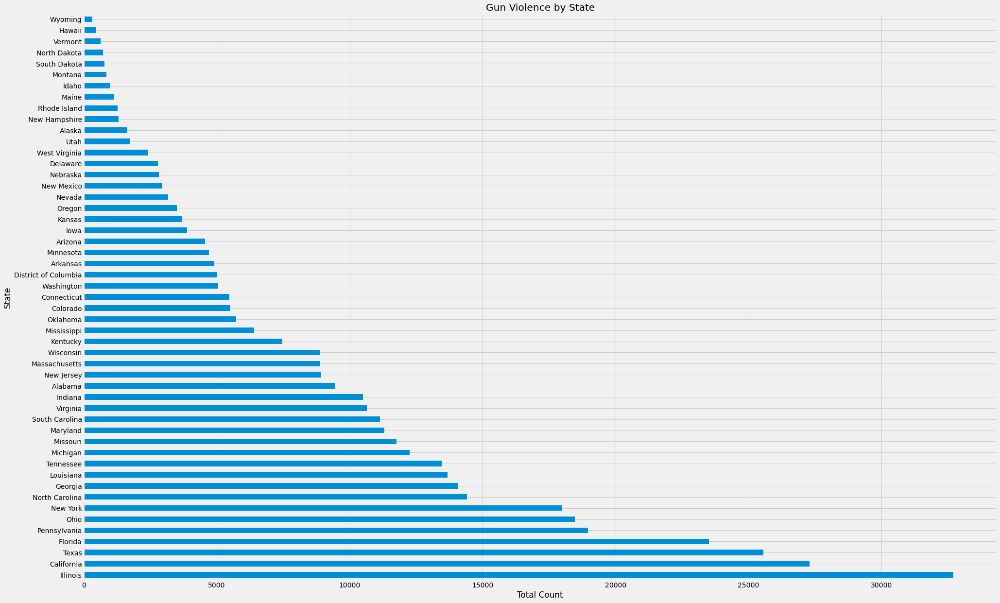

In [80]:
#visualization of the gun violence dataset
matplotlib.style.use('fivethirtyeight')

gun_violence_incidents_df['state'].value_counts().plot(kind='barh')
plt.title('Gun Violence by State')
plt.xlabel('Total Count')
plt.ylabel('State')
plt.rcParams['figure.figsize']=(30,20)

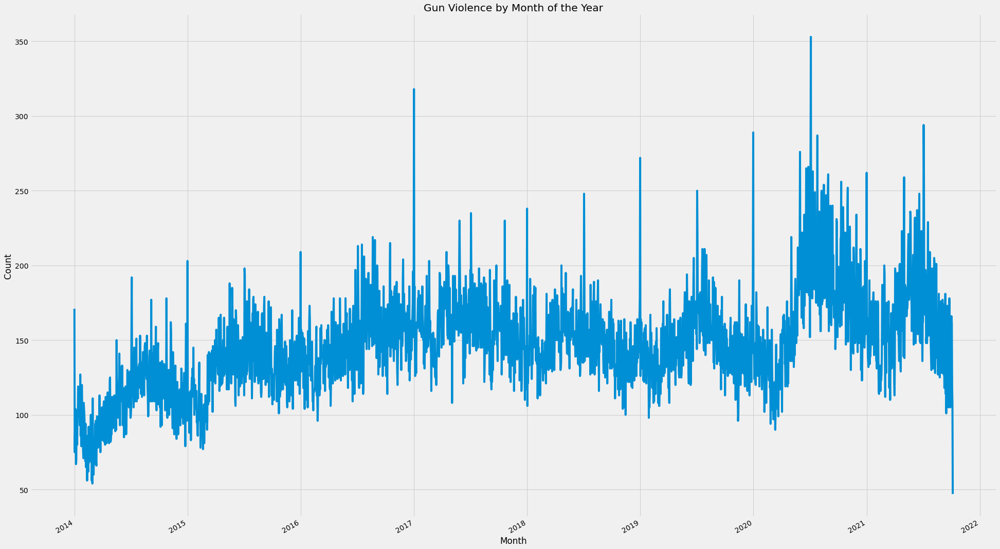

In [81]:
gun_violence_incidents_df['incident_date'].value_counts().plot(kind='line')
plt.title('Gun Violence by Month of the Year')
plt.xlabel('Month')
plt.ylabel('Count')
plt.rcParams['figure.figsize']=(30,20)

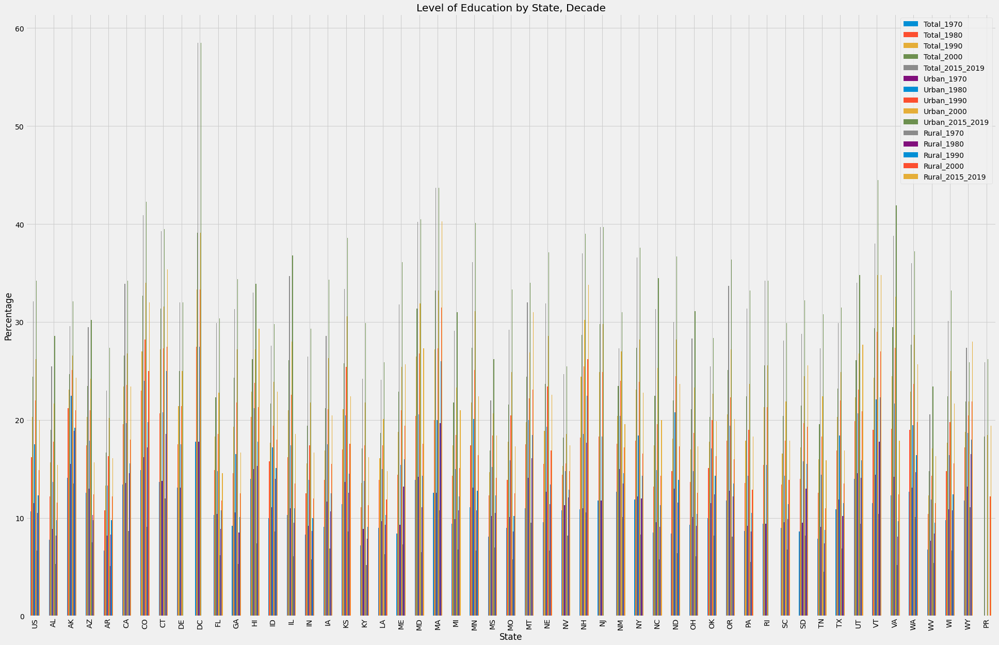

In [82]:
#this one is a bit hard to read in this format.

Education_df.plot(kind='bar')
plt.title('Level of Education by State, Decade')
plt.xlabel('State')
plt.ylabel('Percentage')
plt.rcParams['figure.figsize']=(30,20)

In [83]:
combined_census_df['Population'] = pd.to_numeric(combined_census_df['Population'])

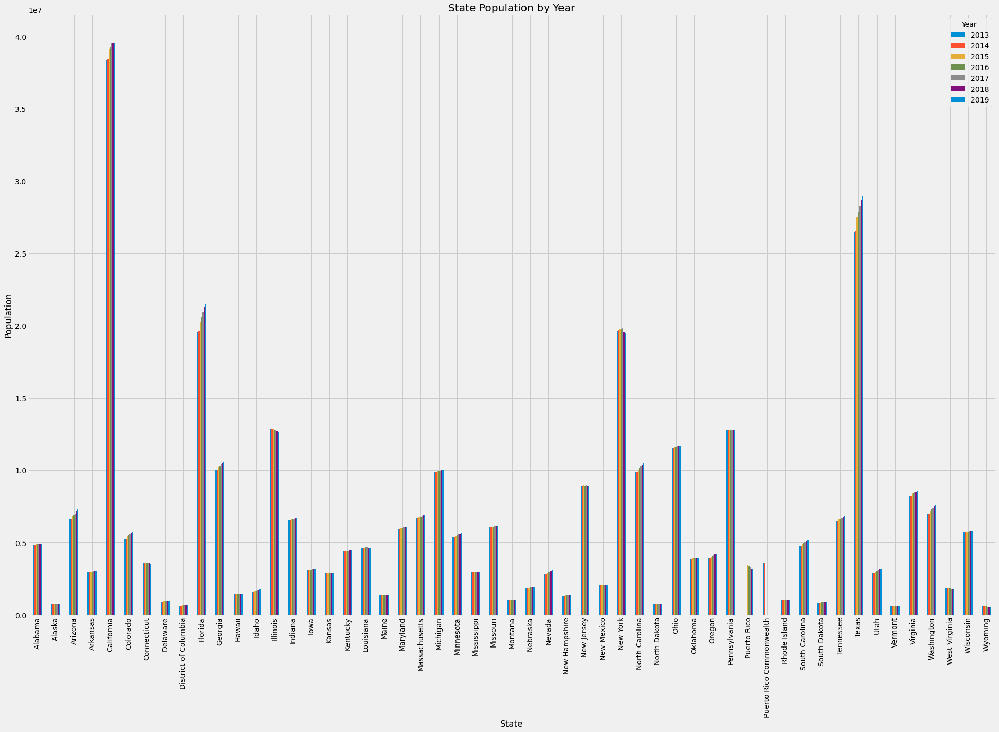

In [84]:
#Census data plot  
#pivot the data so I can show by state, then year
#still a little small

combined_census_df.pivot("State_Name", "Year", "Population").plot(kind='bar')
plt.title('State Population by Year')
plt.xlabel('State')
plt.ylabel('Population')
plt.rcParams['figure.figsize']=(30,20)
plt.show()



In [91]:
gun_violence_incidents_df.head

<bound method NDFrame.head of             incident_date       state city_or_county  \
incident_id                                            
92337          2014-01-01     Alabama       Crenshaw   
92328          2014-01-01     Arizona       Tolleson   
92125          2014-01-01    Oklahoma         Lawton   
92345          2014-01-01  Washington     Georgetown   
92479          2014-01-01     Florida      Homestead   
...                   ...         ...            ...   
2133759        2021-10-06       Texas      Arlington   
2134079        2021-10-06    Illinois        Chicago   
2134082        2021-10-06    Illinois        Chicago   
2134085        2021-10-06    Illinois        Chicago   
2133893        2021-10-06   Wisconsin         Racine   

                                       address  n_killed  n_injured  \
incident_id                                                           
92337                   Campground Church Road         1          0   
92328                       

In [126]:
#because of the size of the data, do we want to join gun violence and census data and focus on single states?
#these smaller queries are too large for jupyter
#here I want the number of incidents by year in the state of AR along with the population numbers for the same year

execute_sql(conn, 'select count(gv.incident_id), c.population, c.year from gun_violence_incidents gv, census c \
            where gv.State_Abbr = c.State_Abbr \
            and strftime("%Y", gv.incident_date) = c.year \
            and gv.State_Abbr = "AR" \
            group by c.year')

#group by strftime("%Y", gv.incident_date) \

[(434, 2958765, '2014'), (468, 2978204, '2015'), (642, 2988248, '2016'), (767, 3004279, '2017'), (777, 3013825, '2018'), (721, 3017804, '2019')]


In [127]:
#execute_sql(conn, 'select count(gv.incident_id), c.population, c.year from gun_violence_incidents gv, census c \
#            where strftime("%Y", gv.incident_date) = c.year \
#            group by c.year')

In [137]:
del gun_violence_census_AR

In [138]:
#lets look at one state to reduce the size of the data

query = 'select count(gv.incident_id) as incidents, c.population, c.year from gun_violence_incidents gv, census c \
            where gv.State_Abbr = c.State_Abbr \
            and strftime("%Y", gv.incident_date) = c.year \
            and gv.State_Abbr = "AR" \
            group by c.year'

gun_violence_census_AR = pd.read_sql(query, conn)

In [139]:
gun_violence_census_AR.head

<bound method NDFrame.head of    incidents  Population  Year
0        434     2958765  2014
1        468     2978204  2015
2        642     2988248  2016
3        767     3004279  2017
4        777     3013825  2018
5        721     3017804  2019>

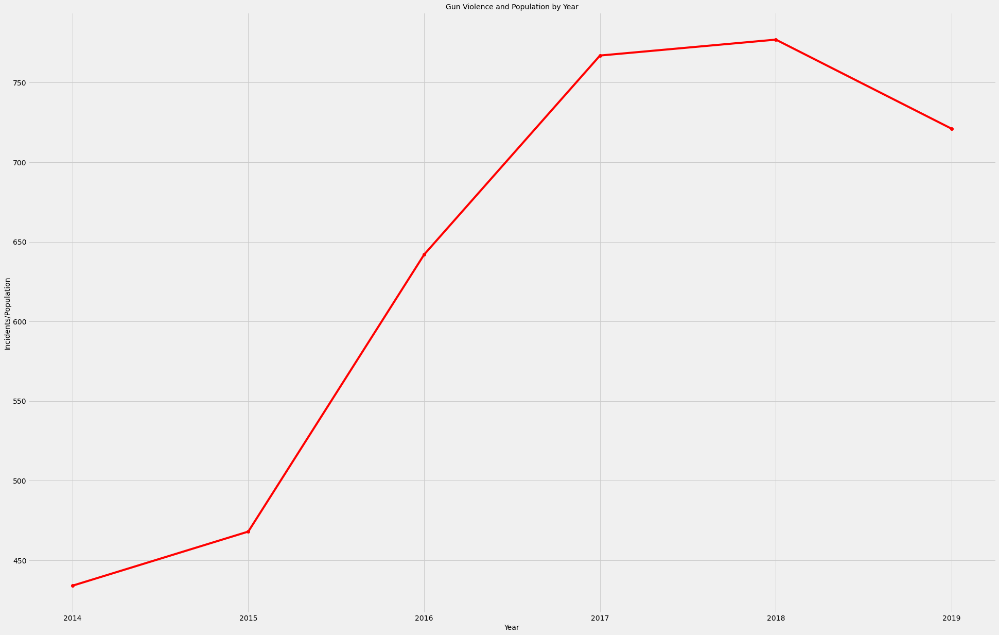

In [140]:
#because the population numbers are so much higher than the incidents, putting them together as numbers would not show any 
#detail
#maybe display this data in gun violence per 100k population?

plt.plot(gun_violence_census_AR['Year'], gun_violence_census_AR['incidents'], color='red', marker='o')
plt.title('Gun Violence and Population by Year', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Incidents/Population', fontsize=14)
plt.grid(True)
plt.show()

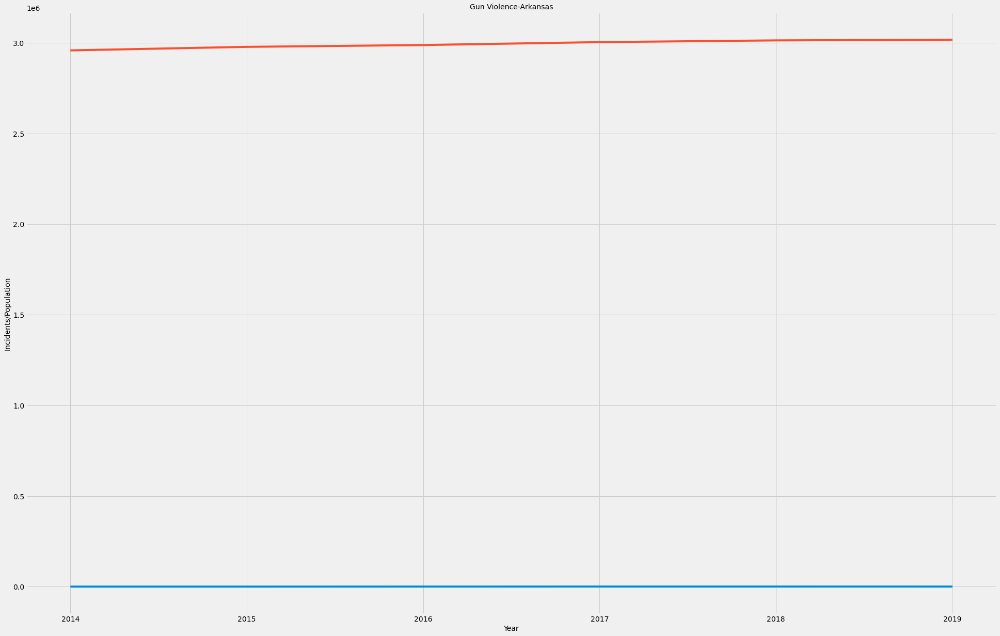

In [145]:
#a quick view of the data together, but this isn't meaningful because the changes are lost

plt.plot(gun_violence_census_AR.set_index('Year'))
plt.title('Gun Violence-Arkansas', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Incidents/Population', fontsize=14)
plt.grid(True)
plt.show()


In [134]:
#since there is such a large difference in the population and the number of firearm incidents, we need to do something to 
#make the graph a little more meaningful

rate_2014 = 434/2958765 * 100000
rate_2015 = 468/2978204 * 100000
rate_2016 = 642/2988248 * 100000
rate_2017 = 767/3004279 * 100000
rate_2018 = 777/3013825 * 100000
rate_2019 = 721/3017804 * 100000

rate_list = [rate_2014, rate_2015, rate_2016, rate_2017, rate_2018, rate_2019]

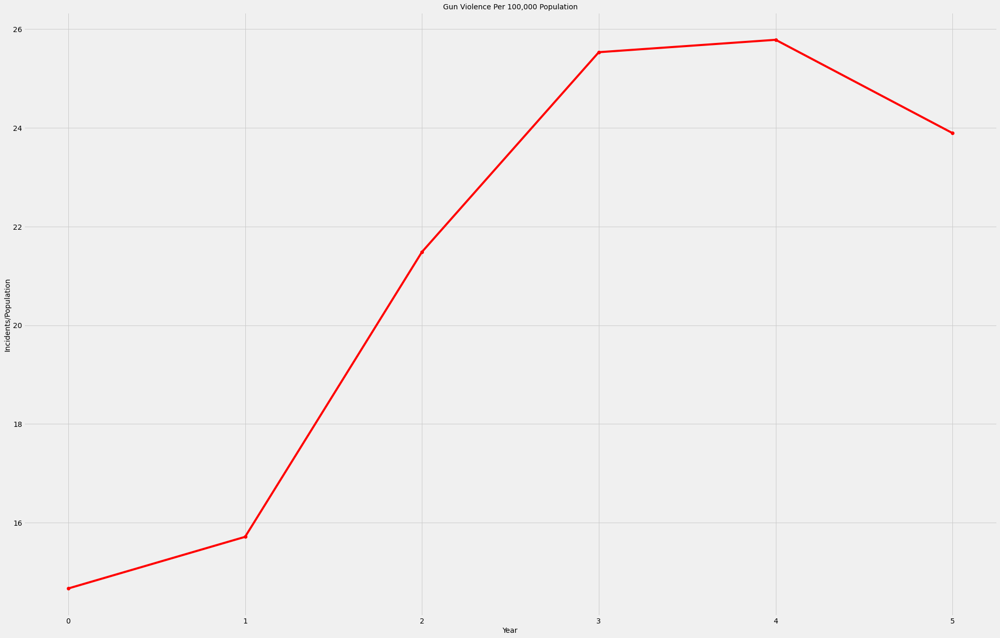

In [143]:
#looking at gun violence per 100k population
#this view looks similar to the gun violence numbers just by themselves
#this indicates that the population hasn't changed signifcantly over the time period but gun violence has

plt.plot(rate_list, color='red', marker='o')
plt.title('Gun Violence Per 100,000 Population-Arkansas', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Incidents/Population', fontsize=14)
plt.grid(True)
plt.show()
